In [1]:
%run setting.ipynb

In [2]:
import os
import re
import pandas as pd
from pandasql import sqldf
import yfinance as yf

In [3]:
import numpy as np
from sklearn.linear_model import LinearRegression
import plotly.express as px

# configuration

In [4]:
leverage_ratio = 3

ETF = '^GSPC'
ETF_3x = 'SPXL'

# data loading

## QQQ

In [17]:
qqq = yf.Ticker(ETF).history(
    period='max', 
    interval='1d', 
    actions=False)

C:\Users\jimwa\AppData\Local\Programs\Python\Python310\lib\site-packages\yfinance\utils.py:771: FutureWarning: The 'unit' keyword in TimedeltaIndex construction is deprecated and will be removed in a future version. Use pd.to_timedelta instead.
  df.index += _pd.TimedeltaIndex(dst_error_hours, 'h')


qqq =  pd.read_csv(f'^GSPC.csv', )

In [18]:
qqq = qqq.reset_index()
qqq['id'] = qqq.index
qqq['Date'] = pd.to_datetime(qqq['Date']).dt.date

In [19]:
qqq.to_sql(
name='qqq', 
con = conn,
if_exists='replace', 
index=False,
)

24186

In [20]:
qqq.head(2)

,Date,Open,High,Low,Close,Volume,id
0,1927-12-30,17.66,17.66,17.66,17.66,0,0
1,1928-01-03,17.76,17.76,17.76,17.76,0,1


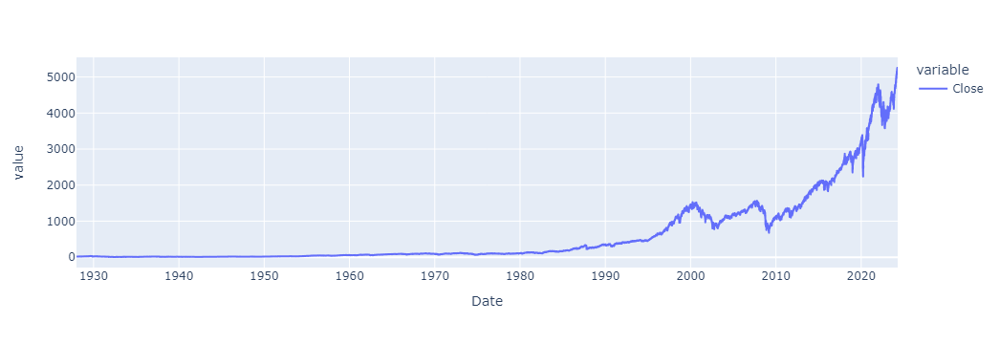

In [21]:
fig = px.line(qqq, x='Date', y=["Close"])
fig.show()

## QLD

data_3x = yf.Ticker(ETF_3x).history(
    period='max', 
    interval='1d', 
    actions=False)

In [22]:
data_3x =  pd.read_csv(f'SPXL.csv', )
data_3x = data_3x.reset_index()
data_3x['id'] = data_3x.index
data_3x['Date'] = pd.to_datetime(data_3x['Date']).dt.date

In [23]:
data_3x.to_sql(
name='qld', 
con = conn,
if_exists='replace', 
index=False,
)

3884

In [24]:
data_3x.head(2)

,index,Date,Open,High,Low,Close,Adj Close,Volume,id
0,0,2008-11-05,4.811667,4.899167,4.176667,4.25,3.333489,229200,0
1,1,2008-11-06,4.150000,4.197500,3.552500,3.60,2.823661,4332000,1


# daily percentage

In [25]:
sql_to_table(
u"""
select qqq.*, 
pre_day.Date as pre_Date,
pre_day.Close as pre_Close,
(qqq.Close - pre_day.Close)/pre_day.Close AS Percent    
from qqq 
left join qqq as pre_day on pre_day.id+1 = qqq.id
order by qqq.Date asc
""",
'qqq'
)

24186

In [26]:
sql(u"""
select * 
from qqq
order by Date asc
limit 2
""")

,Date,Open,High,Low,Close,Volume,id,pre_Date,pre_Close,Percent
0,1927-12-30,17.66,17.66,17.66,17.66,0,0,None,NaN,NaN
1,1928-01-03,17.76,17.76,17.76,17.76,0,1,1927-12-30,17.66,0.005663


# simulation

In [27]:
data_list = sql(f"""
select 
Date,
Percent, 
{leverage_ratio}*Percent as Leveraged_Percent
from qqq
where Percent is not null
""".format(leverage_ratio)).to_dict('records')

In [28]:
data_list[0:3]

[{'Date': '1928-01-03',
  'Percent': 0.0056625358059887295,
  'Leveraged_Percent': 0.016987607417966188},
 {'Date': '1928-01-04',
  'Percent': -0.002252303773188757,
  'Leveraged_Percent': -0.006756911319566272},
 {'Date': '1928-01-05',
  'Percent': -0.009593684135519493,
  'Leveraged_Percent': -0.02878105240655848}]

In [29]:
start_price = qqq['Close'][0]

qqq_price = start_price
tqqq_price = start_price

for r in data_list:
    ###
    qqq_price = qqq_price*(1+r['Percent'])
    r['price'] = qqq_price
    ###
    tqqq_price = tqqq_price*(1+r['Leveraged_Percent'])    
    r['Leveraged_price'] = tqqq_price  

data1 = pd.DataFrame(data_list)

In [30]:
data1.to_sql(
name='leveraged', 
con = conn,
if_exists='replace', 
index=False,
)

24185

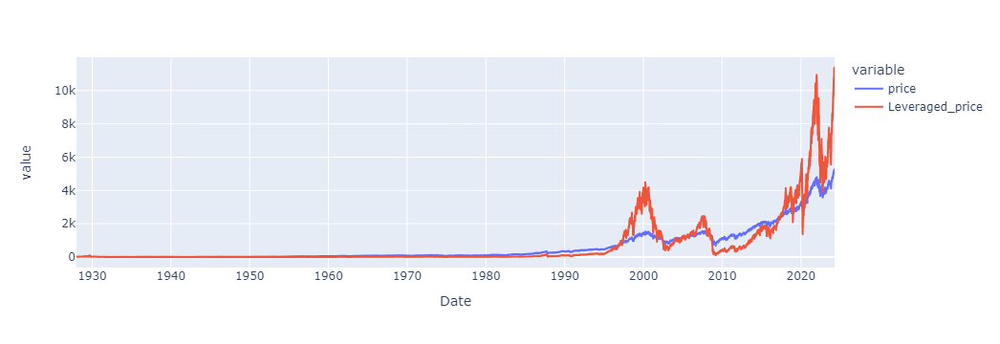

In [31]:
fig = px.line(data1, x='Date', y=[
    'price', 
    'Leveraged_price',
    ])
fig.show()

# regression

In [32]:
compare_3x = sql(u"""
select 
qld.Date,
leveraged.`Leveraged_price`,
qld.Close
from qld
join leveraged on leveraged.Date = qld.Date
order by qld.Date asc
""")

compare_3x.to_sql(
name='compare_3x', 
con = conn,
if_exists='replace', 
index=False,
)

3884

In [33]:
X = compare_3x['Leveraged_price'].to_numpy()
X = np.array([[i] for i in X])
y = compare_3x['Close'].to_numpy()

In [34]:
reg = LinearRegression().fit(X, y)

In [35]:
reg.score(X, y)

print(reg.coef_)

print(reg.intercept_)

[0.01300111]
-0.285351175639029


In [36]:
result = sql(f"""
select 
Date,
`Leveraged_price` * {reg.coef_[0]} + {reg.intercept_} AS simulated_Close,
Close
from compare_3x
""")

result.plot(x ='Date', y=[
    'simulated_Close', 
    'Close',
    ], grid = True)

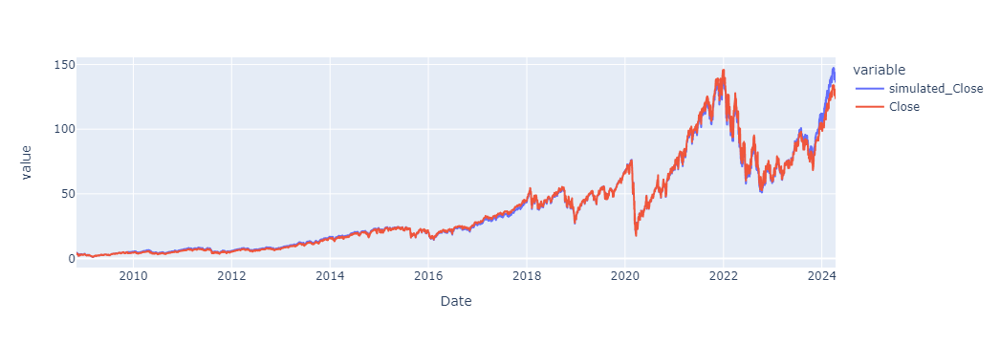

In [37]:
fig = px.line(result, x='Date', y=["simulated_Close",'Close'])
fig.show()

all simulation results

In [39]:
final_result = sql(f"""
select 
data1.Date,
data1.price AS `{ETF}`,
data1.`Leveraged_price` * {reg.coef_[0]} + {reg.intercept_} AS `simulated_{ETF_3x}`,
data_3x.Close as `{ETF_3x}`
from leveraged as data1
left join qld as data_3x 
on data_3x.Date = data1.Date
""")

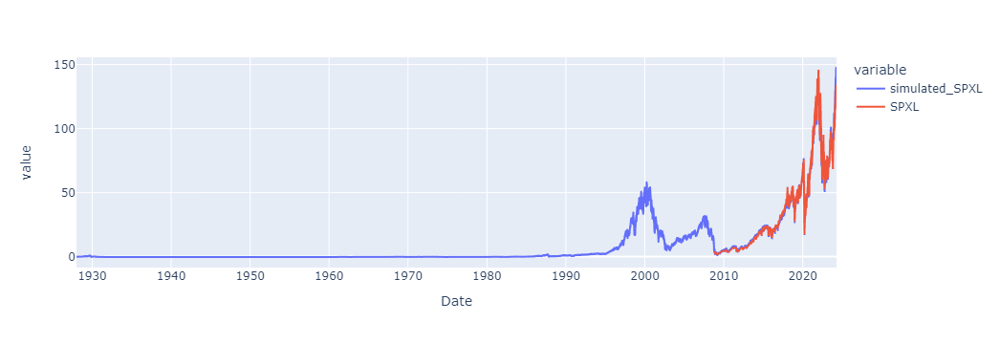

In [40]:
fig = px.line(
final_result, x='Date', y=[
f'simulated_{ETF_3x}',
ETF_3x])
fig.show()

final_result.plot(x ='Date', y=[
    'simulated_{}'.format(ETF_3x),
    ETF_3x,
    ], grid = True)

In [41]:
final_result.to_excel(
f'{ETF_3x}_simulation.xlsx',
index = False,
)

In [42]:
print(f'{ETF_3x}_simulation.xlsx')

SPXL_simulation.xlsx


# END